## Project: Cab market analysis
### Client: G2M
- They want to understand the market. Data includes information on 2 cab companies. The goal is is to help the client identify the right company to make their investment.

In [1]:
#load modues
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import numpy as np
import plotly.express as px

In [2]:
#load data
cab= pd.read_csv("Downloads/Datasets-main/Cab_Data.csv")
customer=pd.read_csv("Downloads/Datasets-main/Customer_ID.csv")
trans=pd.read_csv("Downloads/Datasets-main/Transaction_ID.csv")
city=pd.read_csv("Downloads/Datasets-main/City.csv")

In [33]:
cab.sample(10)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip
50339,10063320,42595,Yellow Cab,NEW YORK NY,40.46,1027.74,534.0720
36603,10046275,42545,Yellow Cab,NEW YORK NY,9.20,287.24,119.2320
42662,10053986,42572,Pink Cab,BOSTON MA,22.89,292.34,258.6570
134872,10165945,42841,Yellow Cab,LOS ANGELES CA,16.20,302.62,231.3360
193589,10238046,43021,Pink Cab,SILICON VALLEY,41.44,670.42,488.9920
67872,10084639,42637,Yellow Cab,TUCSON AZ,19.26,330.14,270.4104
44481,10056300,42574,Yellow Cab,WASHINGTON DC,19.19,280.10,267.1248
120875,10148426,42790,Yellow Cab,LOS ANGELES CA,37.83,795.54,494.8164
111948,10137115,42748,Yellow Cab,DALLAS TX,35.65,1134.17,432.0780
191696,10235465,43014,Yellow Cab,NEW YORK NY,5.80,158.68,77.2560


In [7]:
customer.sample(10)

,Customer ID,Gender,Age,Income (USD/Month)
3284,8008,Male,34,22724
23152,14604,Male,32,23553
33158,29814,Male,65,3367
4787,36696,Male,27,8363
40780,55901,Male,34,3740
10558,18930,Male,28,8516
33359,36864,Male,34,22479
48849,12083,Male,19,6624
31227,10037,Male,60,22577
31890,44390,Male,37,7031


In [8]:
trans.sample(10)

,Transaction ID,Customer ID,Payment_Mode
419722,10419733,57205,Cash
166639,10166650,43152,Cash
124731,10124742,44773,Card
63097,10063108,2589,Cash
326094,10326105,44448,Card
314855,10314866,1848,Card
124,10000135,9584,Card
16322,10016333,53518,Cash
383728,10383739,22656,Card
336462,10336473,29098,Card


In [9]:
city.sample(10)

,City,Population,Users
15,SACRAMENTO CA,"545,776","7,044"
3,MIAMI FL,"1,339,155","17,675"
19,BOSTON MA,"248,968","80,021"
12,SEATTLE WA,"671,238","25,063"
7,PHOENIX AZ,"943,999","6,133"
16,PITTSBURGH PA,"542,085","3,643"
8,DALLAS TX,"942,908","22,157"
14,SAN FRANCISCO CA,"629,591","213,609"
11,AUSTIN TX,"698,371","14,978"
10,DENVER CO,"754,233","12,421"


In [37]:
#general infomation on the datasets
cab.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359392 entries, 0 to 359391
Data columns (total 7 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Transaction ID  359392 non-null  int64  
 1   Date of Travel  359392 non-null  object 
 2   Company         359392 non-null  object 
 3   City            359392 non-null  object 
 4   KM Travelled    359392 non-null  float64
 5   Price Charged   359392 non-null  float64
 6   Cost of Trip    359392 non-null  float64
dtypes: float64(3), int64(1), object(3)
memory usage: 19.2+ MB


In [11]:
trans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440098 entries, 0 to 440097
Data columns (total 3 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   Transaction ID  440098 non-null  int64 
 1   Customer ID     440098 non-null  int64 
 2   Payment_Mode    440098 non-null  object
dtypes: int64(2), object(1)
memory usage: 10.1+ MB


In [12]:
customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49171 entries, 0 to 49170
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Customer ID         49171 non-null  int64 
 1   Gender              49171 non-null  object
 2   Age                 49171 non-null  int64 
 3   Income (USD/Month)  49171 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 1.5+ MB


In [13]:
city.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   City        20 non-null     object
 1   Population  20 non-null     object
 2   Users       20 non-null     object
dtypes: object(3)
memory usage: 608.0+ bytes


- All fields have no missing values

## Areas to investigate
- Which company has maximum cab users at a particular period
- Does margin proportionality increase with increase in number of customers
- What are the attributes of the customer segments

### Hypotheses
- Highest number of cab users
- Cities with the highest numbers of cab users
- Cost of trip for the two cab companies
- Cities that have the highest cost for trips
- Range of income of cab users in different cities
- Correlation of KM travelled and cost of trip
- Travel ratesof cab users.

In [3]:
#uisng merge
custran=pd.merge(customer,trans,on="Customer ID",how="outer")

In [21]:
custran.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 440098 entries, 0 to 440097
Data columns (total 6 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   Customer ID         440098 non-null  int64 
 1   Gender              440098 non-null  object
 2   Age                 440098 non-null  int64 
 3   Income (USD/Month)  440098 non-null  int64 
 4   Transaction ID      440098 non-null  int64 
 5   Payment_Mode        440098 non-null  object
dtypes: int64(4), object(2)
memory usage: 23.5+ MB


In [22]:
custran.sample(10)

,Customer ID,Gender,Age,Income (USD/Month),Transaction ID,Payment_Mode
282592,42525,Male,25,16337,10345100,Cash
190632,4361,Male,33,16243,10213094,Card
353453,44960,Male,21,34408,10132212,Card
253833,1417,Female,36,10706,10363590,Card
175,59804,Male,31,4550,10000031,Card
292884,5421,Male,65,3043,10417487,Card
298188,25321,Male,21,16542,10029695,Card
241286,2915,Male,19,3639,10311682,Card
85500,2044,Female,24,14601,10388659,Cash
263144,5341,Male,35,14526,10138524,Card


In [4]:
#merge city and cab data
cabcity=pd.merge(city,cab,on="City",how="outer")

In [36]:
cabcity.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 359393 entries, 0 to 359392
Data columns (total 9 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   City            359393 non-null  object 
 1   Population      359393 non-null  object 
 2   Users           359393 non-null  object 
 3   Transaction ID  359392 non-null  float64
 4   Date of Travel  359392 non-null  float64
 5   Company         359392 non-null  object 
 6   KM Travelled    359392 non-null  float64
 7   Price Charged   359392 non-null  float64
 8   Cost of Trip    359392 non-null  float64
dtypes: float64(5), object(4)
memory usage: 27.4+ MB


In [40]:
cabcity.sample(10)

,City,Population,Users,Transaction ID,Date of Travel,Company,KM Travelled,Price Charged,Cost of Trip
295414,WASHINGTON DC,"418,859","127,001",10123871.0,12/19/2016,Yellow Cab,19.55,313.80,239.2920
4163,NEW YORK NY,"8,405,837","302,149",10021430.0,04/02/2016,Yellow Cab,35.70,899.09,454.1040
211770,SILICON VALLEY,"1,177,609","27,247",10046829.0,06/18/2016,Yellow Cab,29.75,842.29,360.5700
192687,LOS ANGELES CA,"1,595,037","144,132",10331266.0,05/25/2018,Pink Cab,5.25,65.22,52.5000
85689,NEW YORK NY,"8,405,837","302,149",10386674.0,10/08/2018,Yellow Cab,28.80,627.40,390.5280
193594,LOS ANGELES CA,"1,595,037","144,132",10339321.0,06/16/2018,Yellow Cab,34.20,633.44,410.4000
252689,DALLAS TX,"942,908","22,157",10413652.0,11/24/2018,Yellow Cab,2.38,47.48,30.2736
144605,CHICAGO IL,"1,955,130","164,468",10342993.0,06/30/2018,Pink Cab,17.17,237.87,187.1530
288146,WASHINGTON DC,"418,859","127,001",10046984.0,06/25/2016,Yellow Cab,13.26,238.41,160.7112
323619,WASHINGTON DC,"418,859","127,001",10407348.0,11/09/2018,Yellow Cab,4.36,59.86,61.2144


In [5]:
#merge both cabcity and custran
cab_total=pd.merge(cabcity,custran,on="Transaction ID",how="inner")


In [6]:
#removing the commas from the numbers
cab_total['Users'].replace(',','',regex=True,inplace=True)

In [7]:
#removing the comma from the numbers
cab_total['Population'].replace(',' , '' ,regex=True,inplace=True)

In [205]:
cab_total.head()

,City,Population,Users,Transaction ID,Date of Travel,Company,KM Travelled,Price Charged,Cost of Trip,Customer ID,Gender,Age,Income (USD/Month),Payment_Mode
0,NEW YORK NY,8405837,302149,10000139.0,42377.0,Pink Cab,17.85,242.90,198.135,2416,Male,28,21399,Cash
1,NEW YORK NY,8405837,302149,10000140.0,42378.0,Pink Cab,25.30,407.21,255.530,2060,Male,18,8149,Card
2,NEW YORK NY,8405837,302149,10000141.0,42375.0,Pink Cab,16.32,236.41,186.048,1451,Male,35,23989,Card
3,NEW YORK NY,8405837,302149,10000142.0,42373.0,Pink Cab,12.43,194.61,144.188,1609,Male,30,23036,Card
4,NEW YORK NY,8405837,302149,10000143.0,42378.0,Pink Cab,29.70,434.57,350.460,2927,Male,33,14520,Cash


In [8]:
cab_total['Users']=pd.to_numeric(cab_total['Users'], downcast='integer')

In [9]:
cab_total['Population']=pd.to_numeric(cab_total['Population'],downcast='integer')

In [10]:
cab_total['Profit']=(cab_total['Price Charged']-cab_total['Cost of Trip'])
                     

In [209]:
cab_total.describe()

,Population,Users,Transaction ID,Date of Travel,KM Travelled,Price Charged,Cost of Trip,Customer ID,Age,Income (USD/Month),Profit
count,3.593920e+05,359392.000000,3.593920e+05,359392.000000,359392.000000,359392.000000,359392.000000,359392.000000,359392.000000,359392.000000,359392.000000
mean,3.132198e+06,158365.582267,1.022076e+07,42964.067998,22.567254,423.443311,286.190113,19191.652115,35.336705,15048.822937,137.253198
std,3.315194e+06,100850.051020,1.268058e+05,307.467197,12.233526,274.378911,157.993661,21012.412463,12.594234,7969.409482,160.311840
min,2.489680e+05,3643.000000,1.000001e+07,42371.000000,1.900000,15.600000,19.000000,1.000000,18.000000,2000.000000,-220.060000
25%,6.712380e+05,80021.000000,1.011081e+07,42697.000000,12.000000,206.437500,151.200000,2705.000000,25.000000,8424.000000,28.012000
50%,1.595037e+06,144132.000000,1.022104e+07,42988.000000,22.440000,386.360000,282.480000,7459.000000,33.000000,14685.000000,81.962000
75%,8.405837e+06,302149.000000,1.033094e+07,43232.000000,32.960000,583.660000,413.683200,36078.000000,42.000000,21035.000000,190.030000
max,8.405837e+06,302149.000000,1.044011e+07,43465.000000,48.000000,2048.030000,691.200000,60000.000000,65.000000,35000.000000,1463.966000


## EDA

In [41]:
from pandas_profiling import ProfileReport
cab_profile=ProfileReport(cab_total)
cab_profile

Summarize dataset:   0%|          | 0/29 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Speculations from overall analysis
- The highest number of cab users is in NewYork and the lowest is in Boston
- Yellow Cab has the highest number of users
- Minimum price charged is 15.6 USD
- Maximum price charged is 2048.03 USD
- Minimum cost of trip is 19 USD
- Maximum cost of trip is 691.2 USD
#### more hypotheses
- What factors make yellow cab the most used(price charged, cost of trip)
- Which cities use the pink cab
- Which places charge the highest for cab usage.

### Bivariate analysis

In [7]:
cab_cost=pd.pivot_table(cab_total, 'Cost of Trip',columns=['Company'],aggfunc=np.mean)
cab_cost

Company,Pink Cab,Yellow Cab
Cost of Trip,248.148682,297.922004


- The yellow cab has the highest cost per trip

In [9]:
cab_price=pd.pivot_table(cab_total, 'Price Charged',columns=['Company'],aggfunc=np.mean)
cab_price

Company,Pink Cab,Yellow Cab
Price Charged,310.800856,458.18199


- The yellow cab charges a higher price than the pink cab

In [6]:
cab_pay=pd.pivot_table(cab_total, 'Cost of Trip',columns=['Payment_Mode'],aggfunc=np.mean)
cab_pay

Payment_Mode,Card,Cash
Cost of Trip,286.306072,286.016438


- Most cab users prefer to pay their trips using cards but the margin between cash and cashless is small.

In [170]:
cab_pay1=pd.pivot_table(cab_total, 'Cost of Trip',columns=['Payment_Mode','Company'],aggfunc=np.mean)
cab_pay1

Payment_Mode        Card                    Cash            
Company         Pink Cab  Yellow Cab    Pink Cab  Yellow Cab
Cost of Trip  248.487037  297.946353  247.643827  297.885494

In [8]:
cab_city=pd.pivot_table(cab_total, 'Cost of Trip',columns=['City'],aggfunc=np.mean)
cab_city.reset_index()
cab_city

City,ATLANTA GA,AUSTIN TX,BOSTON MA,CHICAGO IL,DALLAS TX,DENVER CO,LOS ANGELES CA,MIAMI FL,NASHVILLE TN,NEW YORK NY,ORANGE COUNTY,PHOENIX AZ,PITTSBURGH PA,SACRAMENTO CA,SAN DIEGO CA,SEATTLE WA,SILICON VALLEY,TUCSON AZ,WASHINGTON DC
Cost of Trip,282.891205,275.825465,289.338413,290.578457,286.974012,278.417386,278.640013,282.27982,268.962097,290.248851,275.708522,273.130697,272.180261,272.195082,270.852066,281.309417,277.8961,275.670411,294.346518


- New york,Washington,Chicago and Boston are cities with expensive costs for trips

In [9]:
cab_income=pd.pivot_table(cab_total, 'Income (USD/Month)',columns=['City'],aggfunc=np.mean)
cab_income.reset_index()
cab_income

City,ATLANTA GA,AUSTIN TX,BOSTON MA,CHICAGO IL,DALLAS TX,DENVER CO,LOS ANGELES CA,MIAMI FL,NASHVILLE TN,NEW YORK NY,ORANGE COUNTY,PHOENIX AZ,PITTSBURGH PA,SACRAMENTO CA,SAN DIEGO CA,SEATTLE WA,SILICON VALLEY,TUCSON AZ,WASHINGTON DC
Income (USD/Month),14933.150986,14696.495711,15128.563317,15101.718269,14846.508194,14975.655163,15064.550455,14984.887202,14734.359801,15184.765801,15188.9445,15012.038275,14410.332064,15268.22518,15049.874854,14840.748281,15248.547717,14942.952356,14727.430162


- Cities with highest earning income above 15,000USD are :
    - Boston
    - Chicago
    - Los angeles
    - NewYork
    - Orange county
    - Phoenix
    - Sacramento
    - San diego
    - Siliconvalley
- Yet most have low costs for trips using cabs

In [10]:
cabprice=pd.pivot_table(cab_total, 'Price Charged',columns=['City'],aggfunc=np.mean)
cabprice

City,ATLANTA GA,AUSTIN TX,BOSTON MA,CHICAGO IL,DALLAS TX,DENVER CO,LOS ANGELES CA,MIAMI FL,NASHVILLE TN,NEW YORK NY,ORANGE COUNTY,PHOENIX AZ,PITTSBURGH PA,SACRAMENTO CA,SAN DIEGO CA,SEATTLE WA,SILICON VALLEY,TUCSON AZ,WASHINGTON DC
Price Charged,394.368363,383.403288,348.907296,350.398561,447.830969,382.361179,370.487465,399.77304,318.640575,570.196342,390.475442,366.609806,337.043899,321.762548,348.320021,356.923379,432.457114,348.306712,374.207281


In [11]:
companyincome=pd.pivot_table(cab_total, 'Income (USD/Month)',columns=['Company'],aggfunc=np.mean)
companyincome.reset_index()
companyincome

Company,Pink Cab,Yellow Cab
Income (USD/Month),15059.047137,15045.669817


- for cities with high income,they can choose to either use the pink cab or the yellow cab, there is not much disparity.

In [85]:
companyincome=pd.pivot_table(cab_total, 'Users',columns=['Company'],aggfunc=np.mean)
companyincome.reset_index()
companyincome

Company,Pink Cab,Yellow Cab
Users,125590.81333,168473.246981


- Yellow cab has the highest number of users

In [174]:
cityusers=pd.pivot_table(cab_total, 'Users',columns=['City'],aggfunc=np.mean)
cityusers.reset_index()
cityusers

City,ATLANTA GA,AUSTIN TX,BOSTON MA,CHICAGO IL,DALLAS TX,DENVER CO,LOS ANGELES CA,MIAMI FL,NASHVILLE TN,NEW YORK NY,ORANGE COUNTY,PHOENIX AZ,PITTSBURGH PA,SACRAMENTO CA,SAN DIEGO CA,SEATTLE WA,SILICON VALLEY,TUCSON AZ,WASHINGTON DC
Users,24701,14978,80021,164468,22157,12421,144132,17675,9270,302149,12994,6133,3643,7044,69995,25063,27247,5712,127001


- Cities with the highest cab users are:
    - New York
    - Los angeles
    - Chicago
    - Washington DC

In [90]:
citypopulation=pd.pivot_table(cab_total, 'Population',columns=['City'],aggfunc=np.mean)
citypopulation.reset_index()
citypopulation

City,ATLANTA GA,AUSTIN TX,BOSTON MA,CHICAGO IL,DALLAS TX,DENVER CO,LOS ANGELES CA,MIAMI FL,NASHVILLE TN,NEW YORK NY,ORANGE COUNTY,PHOENIX AZ,PITTSBURGH PA,SACRAMENTO CA,SAN DIEGO CA,SEATTLE WA,SILICON VALLEY,TUCSON AZ,WASHINGTON DC
Population,814885,698371,248968,1955130,942908,754233,1595037,1339155,327225,8405837,1030185,943999,542085,545776,959307,671238,1177609,631442,418859


- Cities that have high cab users also have a high population but this varies
    - New york
    - Los angeles
    - Chicago
    - Silicon valley
    - Orange county
    

In [169]:
cityusers=pd.pivot_table(cab_total, 'Users',columns=['Payment_Mode','Company'],aggfunc=np.mean)
cityusers.reset_index()
cityusers

Payment_Mode           Card                          Cash               
Company            Pink Cab     Yellow Cab       Pink Cab     Yellow Cab
Users         125261.978726  168370.352933  126081.462962  168627.532813

- Interesting to note that most cab users pay using cash

In [177]:
usersage=pd.pivot_table(cab_total, ['Age','Users'],columns=['Company'],aggfunc=np.mean)
usersage.reset_index()
usersage

Company,Pink Cab,Yellow Cab
Age,35.322414,35.341112
Users,125590.813330,168473.246981


- Most young adults use the yellow cab

### Univariate analysis

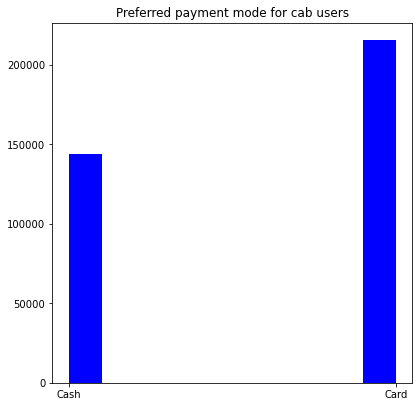

In [14]:
fig=plt.figure(figsize=(5,5))
ax=fig.add_axes([0,0,1,1])
plt.hist(cab_total['Payment_Mode'] ,color="b")
ax.set_title("Preferred payment mode for cab users")
plt.show()

### research 
- Taxi fares depend on traffic, weather and route to destination
- In NYC cab drivers are required to accept cards. passengers pay for rides by swiping their card through a card reader.

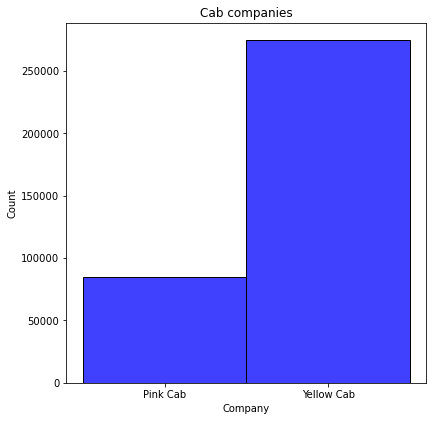

In [16]:
fig=plt.figure(figsize=(5,5))
bx=fig.add_axes([0,0,1,1])
bx.set_title("Cab companies")
sns.histplot(cab_total['Company'],color="b");

In [11]:

cab1=pd.read_csv('Downloads/Datasets-main/Cab1_Data.csv')
dates=pd.to_datetime(cab1['Date of Travel'])

In [12]:
#extract year from the data
cab_total['Year']=dates.dt.year

In [217]:
cab_total.head()

,City,Population,Users,Transaction ID,Date of Travel,Company,KM Travelled,Price Charged,Cost of Trip,Customer ID,Gender,Age,Income (USD/Month),Payment_Mode,Profit,Year
0,NEW YORK NY,8405837,302149,10000139.0,42377.0,Pink Cab,17.85,242.90,198.135,2416,Male,28,21399,Cash,44.765,2016
1,NEW YORK NY,8405837,302149,10000140.0,42378.0,Pink Cab,25.30,407.21,255.530,2060,Male,18,8149,Card,151.680,2016
2,NEW YORK NY,8405837,302149,10000141.0,42375.0,Pink Cab,16.32,236.41,186.048,1451,Male,35,23989,Card,50.362,2016
3,NEW YORK NY,8405837,302149,10000142.0,42373.0,Pink Cab,12.43,194.61,144.188,1609,Male,30,23036,Card,50.422,2016
4,NEW YORK NY,8405837,302149,10000143.0,42378.0,Pink Cab,29.70,434.57,350.460,2927,Male,33,14520,Cash,84.110,2016


C:\Users\betty123\OneDrive\Documents\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



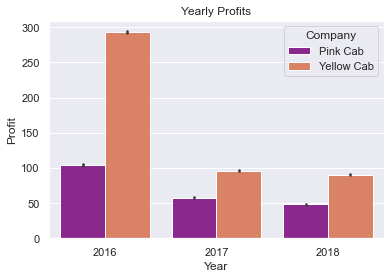

In [39]:
sns.barplot('Year','Profit',hue='Company',data=cab_total,palette="plasma")
plt.title("Yearly Profits");

- the yellow cab recorded the highest profit in 2016 and has been recording higher profits than the pink cab.

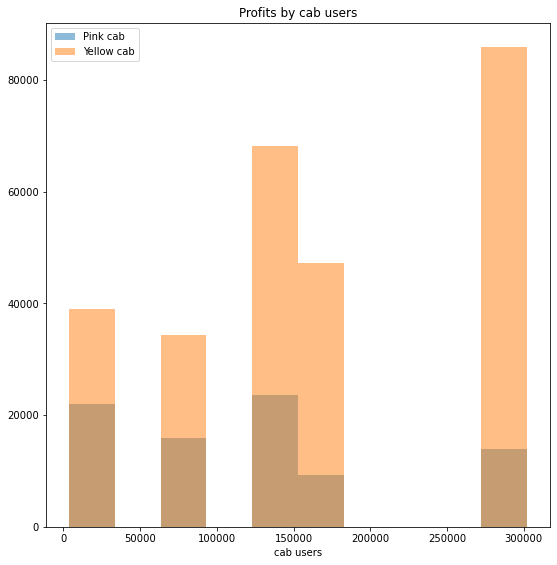

In [37]:
fig=plt.figure(figsize=(7,7))
px=fig.add_axes([0,0,1,1])
plt.hist('Users', data=cab_total[cab_total['Company'] == 'Pink Cab'], alpha=0.5, label='Pink cab')
plt.hist('Users', data=cab_total[cab_total['Company'] == 'Yellow Cab'], alpha=0.5, label='Yellow cab')
px.set_title("Profits by cab users")
px.set_xlabel("cab users")
plt.legend();

C:\Users\betty123\OneDrive\Documents\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



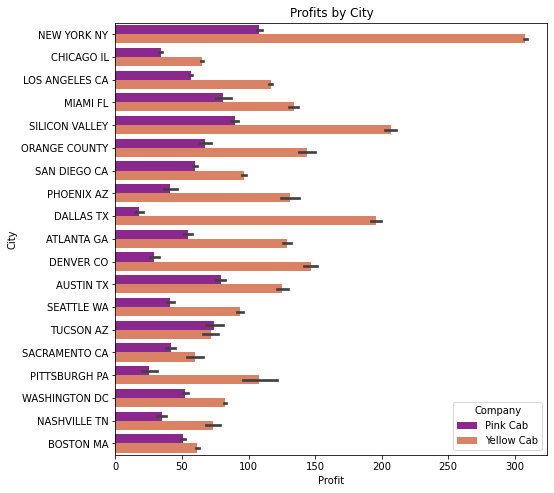

In [24]:
fig=plt.figure(figsize=(6,6))
qx=fig.add_axes([0,0,1,1])
sns.barplot('Profit','City',hue='Company',data=cab_total,orient='h',palette="plasma")
qx.set_title("Profits by City");

- In all cities the Yellow cab has gotten higher profits than Pink Cab especially in New York.

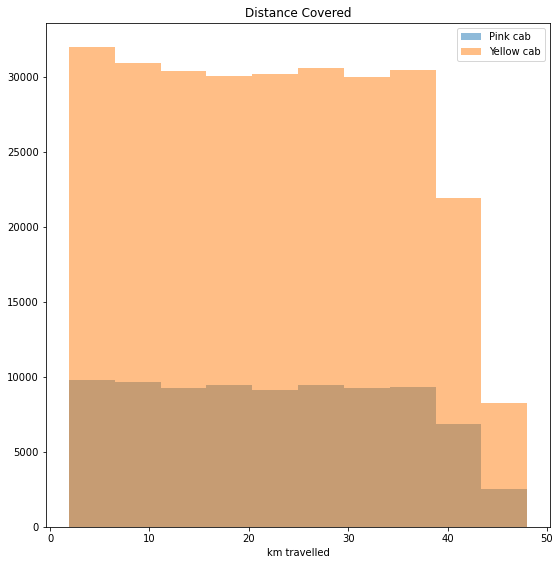

In [44]:
fig=plt.figure(figsize=(7,7))
bx=fig.add_axes([0,0,1,1])
plt.hist('KM Travelled', data=cab_total[cab_total['Company'] == 'Pink Cab'], alpha=0.5, label='Pink cab')
plt.hist('KM Travelled', data=cab_total[cab_total['Company'] == 'Yellow Cab'], alpha=0.5, label='Yellow cab')
bx.set_title("Distance Covered")
bx.set_xlabel("km travelled")
plt.legend();

- The yellow cab has made more trips than the pink cab

C:\Users\betty123\OneDrive\Documents\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

C:\Users\betty123\OneDrive\Documents\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



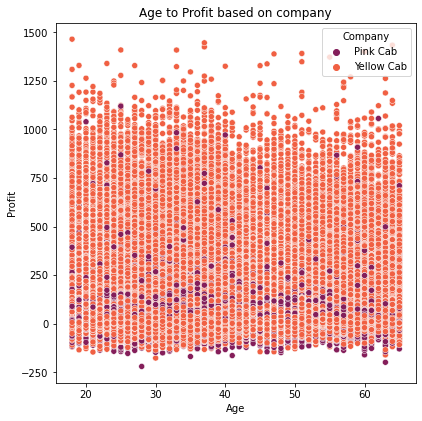

In [48]:
fig=plt.figure(figsize=(5,5))
zx=fig.add_axes([0,0,1,1])
sns.scatterplot('Age','Profit',data=cab_total,hue='Company',palette="rocket")
zx.set_title("Age to Profit based on company");

- Within the age groups , the yellow cab is most preffered especially by young adults.

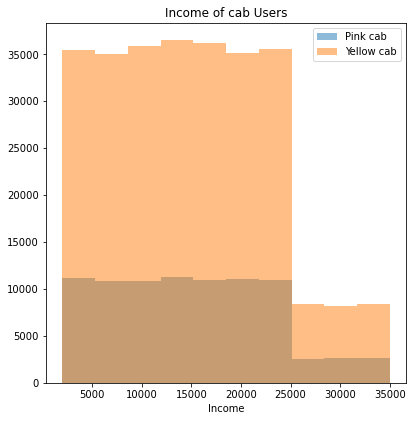

In [56]:
fig=plt.figure(figsize=(5,5))
wx=fig.add_axes([0,0,1,1])
plt.hist('Income (USD/Month)', data=cab_total[cab_total['Company'] == 'Pink Cab'], alpha=0.5, label='Pink cab')
plt.hist('Income (USD/Month)', data=cab_total[cab_total['Company'] == 'Yellow Cab'], alpha=0.5, label='Yellow cab')
plt.legend()
plt.xlabel("Income")
wx.set_title("Income of cab Users");


- Most cab users are of low-medium income.They travel using the Yellow cab

C:\Users\betty123\OneDrive\Documents\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



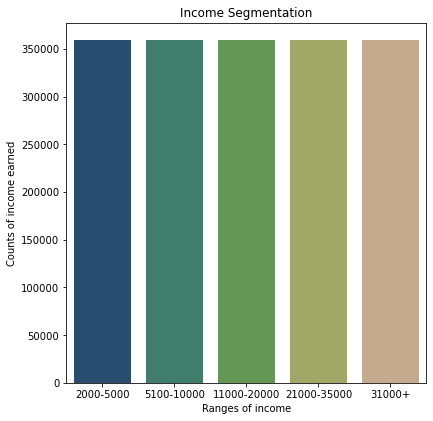

In [29]:
income=cab_total['Income (USD/Month)']
profit=cab_total['Profit']
income1=(income>=2000) & (income<=5000)
income2=(income>=5100) & (income<=10000)
income3=(income>=11000) & (income<=20000)
income4=(income>=21000) &(income<=35000)
income5=income>=31000
y=[len(income1.values),len(income2.values),len(income3.values),len(income4.values),len(income5.values)]
x = ["2000-5000","5100-10000","11000-20000","21000-35000","31000+"]
fig=plt.figure(figsize=(5,5))
sx=fig.add_axes([0,0,1,1])
sns.barplot(x,y,palette="gist_earth")
sx.set_ylabel("Counts of income earned")
sx.set_xlabel("Ranges of income")
sx.set_title("Income Segmentation");

C:\Users\betty123\OneDrive\Documents\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



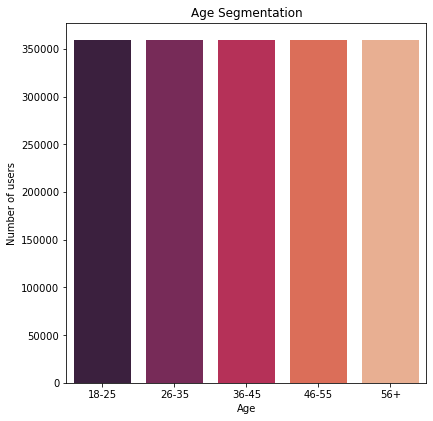

In [30]:
age=cab_total['Age']
age1=(age<=18) & (age>=25)
age2=(age<=26) & (age>=35)
age3=(age<=36) & (age>=45)
age4=(age<=46) &(age>=55)
age5=age>=56
y=[len(age1.values),len(age2.values),len(age3.values),len(age4.values),len(age5.values)]
x = ["18-25","26-35","36-45","46-55","56+"]
fig=plt.figure(figsize=(5,5))
sx=fig.add_axes([0,0,1,1])
sns.barplot(x,y,palette="rocket")
sx.set_ylabel("Number of users")
sx.set_xlabel("Age")
sx.set_title("Age Segmentation");

C:\Users\betty123\OneDrive\Documents\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



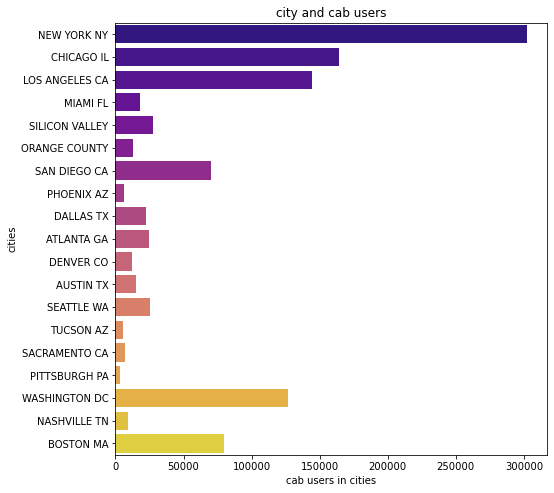

In [25]:
fig=plt.figure(figsize=(6,6))
fx=fig.add_axes([0,0,1,1])
city=cab_total['City']
user=cab_total['Users']
sns.barplot(user,city, palette='plasma',orient='h')
fx.set_xlabel("cab users in cities")
fx.set_ylabel("cities")
fx.set_title("city and cab users");

- Cities with high number of cab users are:
    - New york
    - Los angeles
    - Chicago
    - Washington DC
    - Boston
    
    

C:\Users\betty123\OneDrive\Documents\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


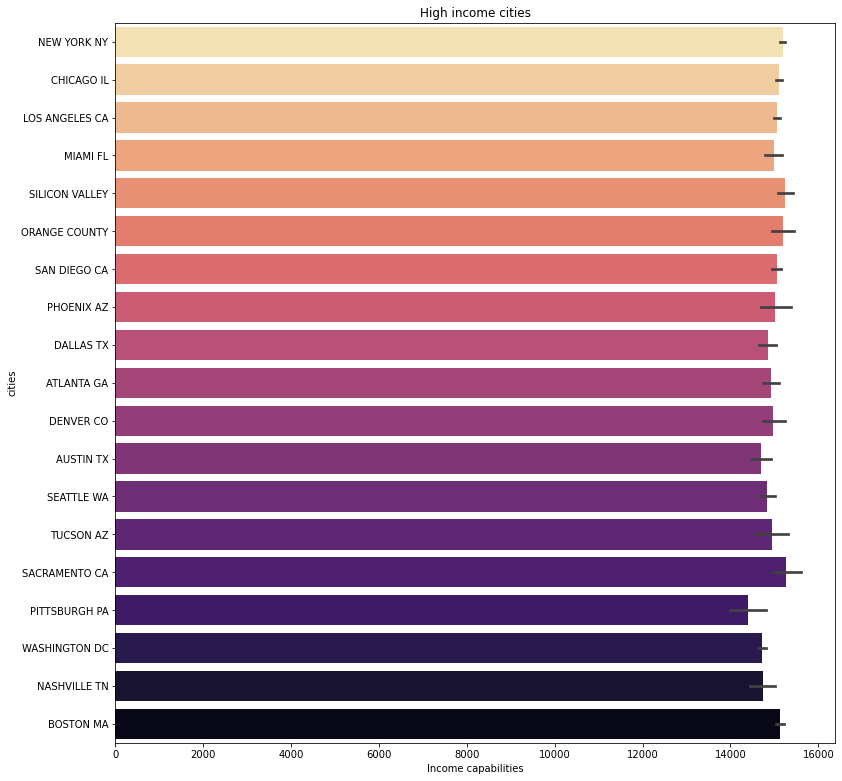

In [107]:
fig=plt.figure(figsize=(10,10))
cx=fig.add_axes([0,0,1,1])
city=cab_total['City']
income=cab_total['Income (USD/Month)']
sns.barplot(income,city, palette='magma_r',orient='h')
cx.set_xlabel("Income capabilities")
cx.set_ylabel("cities")
cx.set_title("High income cities");

- the variations in income in the cities is very low and we can say that people earn income fairly which means that people can afford to use cab transport

C:\Users\betty123\OneDrive\Documents\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



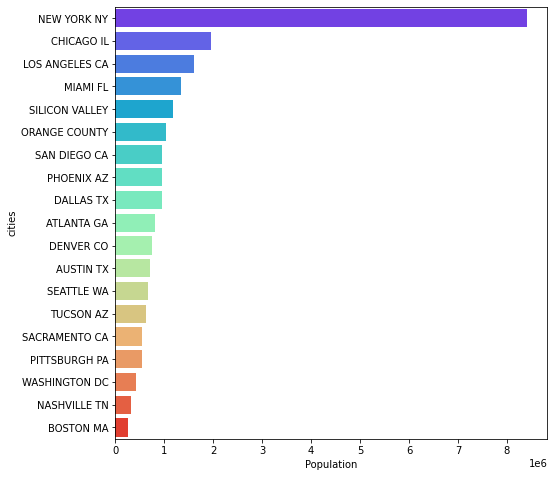

In [26]:
fig=plt.figure(figsize=(6,6))
gx=fig.add_axes([0,0,1,1])
city=cab_total['City']
pp=cab_total['Population']
sns.barplot(pp,city, palette='rainbow',orient='h')
gx.set_xlabel("Population")
gx.set_ylabel("cities");

- New york records the highest population and this matches also with a high number of cab users in the city

C:\Users\betty123\OneDrive\Documents\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


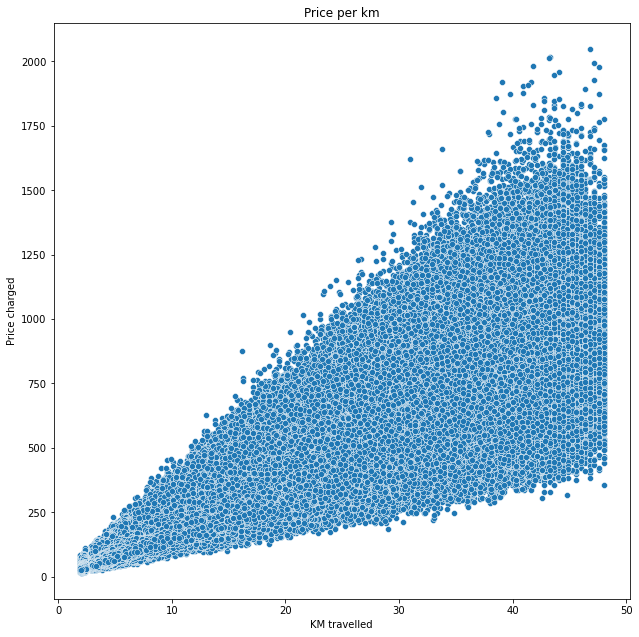

In [112]:
fig=plt.figure(figsize=(8,8))
ix=fig.add_axes([0,0,1,1])
km=cab_total['KM Travelled']
price=cab_total['Price Charged']
sns.scatterplot(km,price, palette='terrain')
ix.set_xlabel("KM travelled")
ix.set_ylabel("Price charged")
ix.set_title("Price per km");

- There is a high positive correlation bewtween km travelled and price charged which means that for every long distance travelled there is an increase in price charged by the cabs

C:\Users\betty123\OneDrive\Documents\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


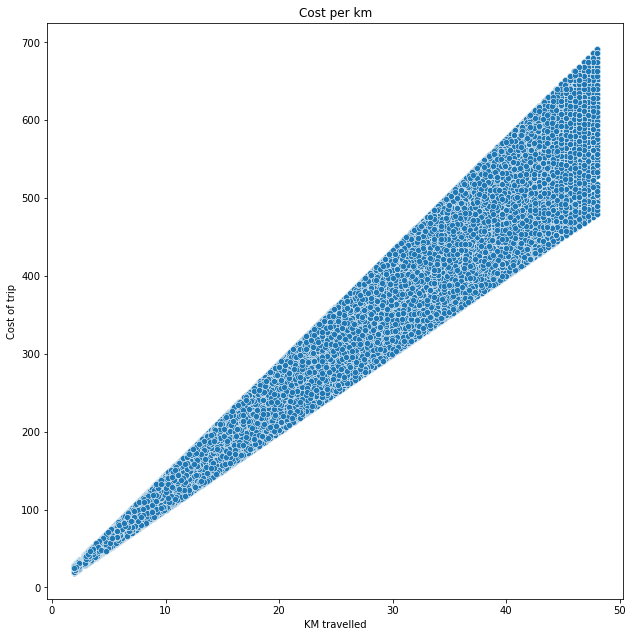

In [113]:
fig=plt.figure(figsize=(8,8))
jx=fig.add_axes([0,0,1,1])
km=cab_total['KM Travelled']
cost=cab_total['Cost of Trip']
sns.scatterplot(km,cost, palette='seismic')
jx.set_xlabel("KM travelled")
jx.set_ylabel("Cost of trip")
jx.set_title("Cost per km");

- The same goes for these variables, that the cost of a trip increases with increase in distance covered.

C:\Users\betty123\OneDrive\Documents\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



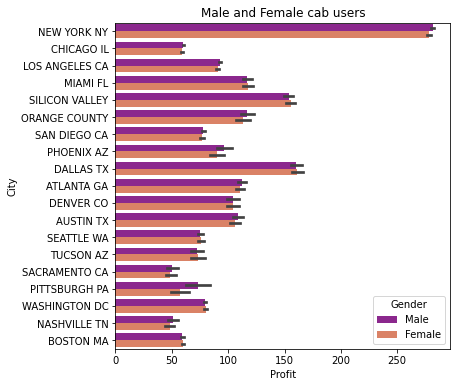

In [34]:
plt.figure(figsize=(6,6))
plt.title("Male and Female cab users")
sns.barplot('Profit','City',palette='plasma',hue='Gender',data=cab_total,orient='h');

- Most cab users are male. Statistics show that females are not likely to use taxicabs in the US.(https://www.statista.com/statistics/934477/taxi-cabs-likelihood-to-use-united-states-by-gender/) Is this consistent with population?

C:\Users\betty123\OneDrive\Documents\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



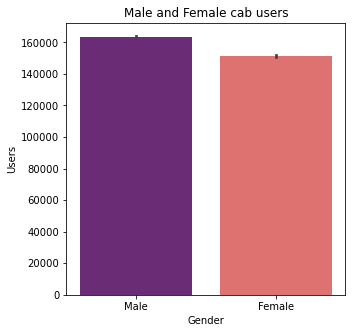

In [36]:
plt.figure(figsize=(5,5))
plt.title("Male and Female cab users")
sns.barplot('Gender','Users',palette='magma',data=cab_total);

C:\Users\betty123\OneDrive\Documents\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


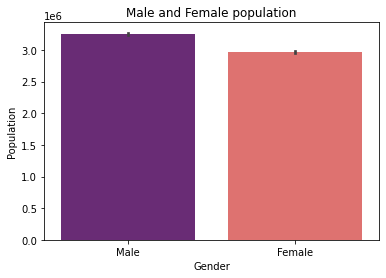

In [117]:
pp=cab_total['Population']
sex=cab_total['Gender']
plt.title("Male and Female population")
sns.barplot(sex,pp,palette='magma');

- Yes it is consistent. Male population is highest in these cities which also makes them the many that use cabs in the cities

#### Yellow cabs in the US
- States present are:
    - Baltimore, Maryland
    - Illinois
    - Oklahoma
    - San francisco
    - San diego
    - Orange county
    - Arizona
    - Massachusetts, Springfield
    - Kentucky, Louisville
    - New york
    - Los angeles 
- they have been used here for more than 40 years

C:\Users\betty123\OneDrive\Documents\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



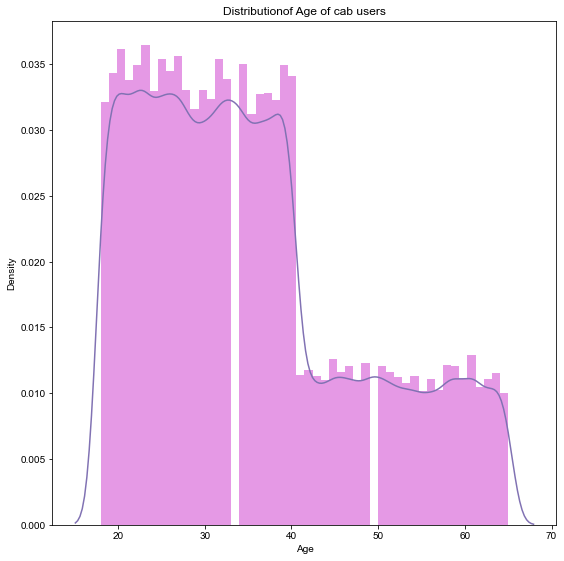

In [37]:
fig=plt.figure(figsize=(7,7))
mx=fig.add_axes([0,0,1,1])
sns.distplot(cab_total['Age'],color='m',hist=True)
mx.set_title("Distributionof Age of cab users")
sns.set()

- Most cab users are young adults aged between 18 and 35. With a majority also lying in the age range of 35-40.

- there are points where there is a increase in travel consistent with a drop in travel by users

<AxesSubplot:xlabel='Year', ylabel='Profits'>

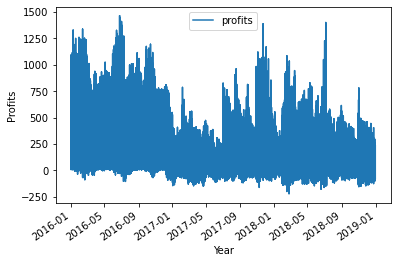

In [13]:

profit=cab_total['Profit']
time=({"year":dates,"profits":profit})
time=pd.DataFrame(data=time)
time.index=time['year']
time= time.drop('year',axis=1)
time.columns = ['profits']
time.plot(rot=35,xlabel="Year",ylabel="Profits")




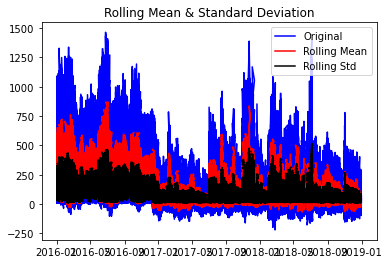

In [64]:
rolmean=time.rolling(window=12).mean()
rolstd=time.rolling(window=12).std()
orig = plt.plot(time, color='blue',label='Original')
mean = plt.plot(rolmean, color='red', label='Rolling Mean')
std = plt.plot(rolstd, color='black', label = 'Rolling Std')
plt.legend(loc='best')
plt.title('Rolling Mean & Standard Deviation')
plt.show(block=False)

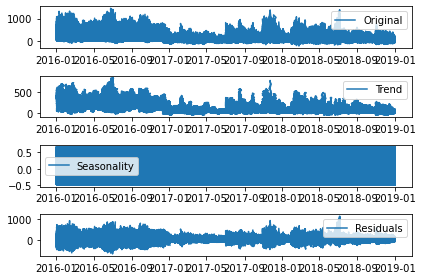

In [17]:
from statsmodels.tsa.seasonal import seasonal_decompose

decomposition = seasonal_decompose(time,model='additive',period=12,extrapolate_trend = 12)

trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

plt.subplot(411)
plt.plot(time, label='Original')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(trend, label='Trend')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(seasonal,label='Seasonality')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(residual, label='Residuals')
plt.legend(loc='best')
plt.tight_layout()

<AxesSubplot:xlabel='year'>

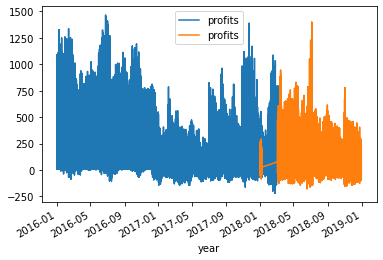

In [19]:
train=time[:int(0.7*(len(time)))]
test=time[int(0.7*len(time)):]
ax=train.plot()
test.plot(ax=ax)

### Outliers detection

In [33]:
user=cab_total['Users']
km=cab_total['KM Travelled']
pop=cab_total['Population']
cost=cab_total['Cost of Trip']
price=cab_total['Price Charged']
print('Outliers present in users',user.nunique())
print('Outliers present in population',pop.nunique())
print('Outliers present in distance travelled',km.nunique())
print('Outliers present in price',price.nunique())
print('Outliers present in cost of trip',cost.nunique())

Outliers present in users 19
Outliers present in population 19
Outliers present in distance travelled 874
Outliers present in price 99176
Outliers present in cost of trip 16291


C:\Users\betty123\OneDrive\Documents\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


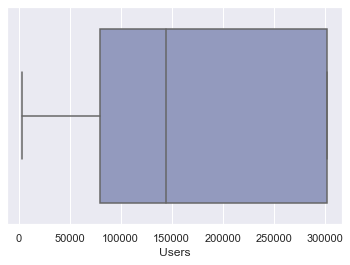

In [180]:
sns.boxplot(cab_total['Users'],palette='BuPu');

C:\Users\betty123\OneDrive\Documents\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


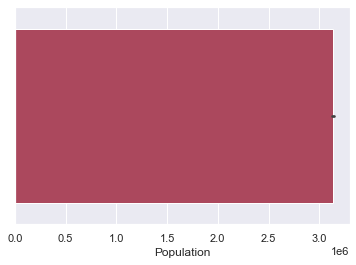

In [181]:
sns.barplot(cab_total['Population'],palette='inferno');

C:\Users\betty123\OneDrive\Documents\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


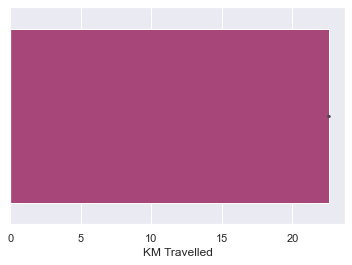

In [184]:
sns.barplot('KM Travelled',data=cab_total,palette='magma');

C:\Users\betty123\OneDrive\Documents\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


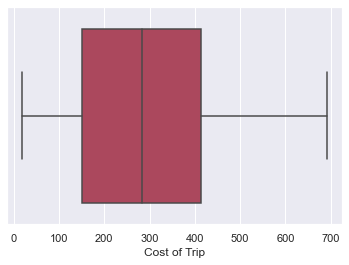

In [186]:
sns.boxplot('Cost of Trip', data=cab_total,palette='inferno');

C:\Users\betty123\OneDrive\Documents\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


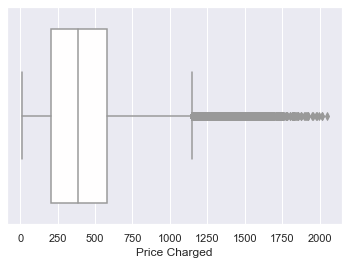

In [187]:
sns.boxplot('Price Charged',data=cab_total,palette='bwr');

## Conclusions
- Yellow cab is most preferred by users:
    1. Most people use cards to pay for their trips and the yellow cabs allow riders to pay using card readers
    2. Yellow cabs are operational in many states in the US.
    3. When it comes to popularity, the yellow cab is used by most young adults.
### Recommendations
1. Investing in the yellow cab will be a great oppurtunity because there is a huge market
2. Customer-reach- Yellow cab has generally outperformed the pink cab and has a great customer reach because it is very popular.
3. Number of trips- Yellow cab has made the highest overall number of trips according to the high distance covered by the cabs.
4. Affordability- Most of the population is low-medium income earners and the yellow cab and pink cab are affordable but still the yellow cab takes the lead.
5. Accessibility- since the yellow cab seems to be most popular, it is easy to access it especially in big cities like New York and California.
6. Age-groups- The yellow cab has great fondness among young people considering also a lot of young people live in the cities as well.
